In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
%load_ext version_information
%version_information numpy, dlib, matplotlib, imageio, gaze, glob

Software versions
Python 3.6.9 64bit [GCC 8.4.0]
IPython 7.8.0
OS Linux 4.15.0 118 generic x86_64 with Ubuntu 18.04 bionic
numpy 1.17.2
dlib 19.19.0
matplotlib 3.1.1
imageio 2.6.1
gaze The 'gaze' distribution was not found and is required by the application
glob The 'glob' distribution was not found and is required by the application
Fri Oct 02 11:52:10 2020 UTC

In [3]:
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt

# detecting and cropping faces

In [4]:
import os
import glob

In [5]:
from gaze import init, Data

date = '20200930'
args = init(batch_size=8, no_cuda=True, verbose=1, dataset_faces_folder='dataset_test_%s'%date,
            dataset_folder='../dataset_new')
d = Data(args)

Found 125 sample images;  100  to train 25 to test


In [6]:
args

Namespace(N_cv=20, activation='relu', batch_size=8, conv1_bn_momentum=0.5, conv1_dim=9, conv1_kernel_size=8, conv2_bn_momentum=0.5, conv2_dim=36, conv2_kernel_size=12, crop=75, dataset_faces_folder='dataset_test_20200930', dataset_folder='../dataset_new', dataset_test='dataset_test', dataset_train='dataset_train', dense_bn_momentum=0.5, dimension=30, do_adam=False, epochs=40, fullsize=75, log_interval=0, lr=0.01, mean=0.4, momentum=0.05, no_cuda=True, num_processes=1, seed=42, size=40, size_test_set=0.2, std=0.3, stride1=2, stride2=4, test_batch_size=16, verbose=1)

In [7]:
n_show = 10
for target in d.classes:
    for filename in glob.glob(os.path.join(args.dataset_folder, target) + '/*.png')[-n_show:]:
        print(filename)

../dataset_new/blink/2020-07-10_AnnaMask__026.png
../dataset_new/blink/2020-07-10_AnnaMask__054.png
../dataset_new/blink/2020-07-10_AnnaMask__030.png
../dataset_new/blink/2020-07-10_AnnaMask__101.png
../dataset_new/blink/2020-07-10_AnnaMask__007.png
../dataset_new/blink/2020-07-10_AnnaMask__011.png
../dataset_new/blink/2020-07-10_AnnaMask__049.png
../dataset_new/blink/2020-07-10_AnnaMask__062.png
../dataset_new/blink/2020-07-10_AnnaMask__074.png
../dataset_new/blink/2020-07-10_AnnaMask__047.png
../dataset_new/center/2020-07-10_AnnaMask__024.png
../dataset_new/center/2020-07-10_AnnaMask__057.png
../dataset_new/center/2020-07-10_AnnaMask__096.png
../dataset_new/center/2020-07-10_AnnaMask__002.png
../dataset_new/center/2020-07-10_AnnaMask__100.png
../dataset_new/center/2020-07-10_AnnaMask__067.png
../dataset_new/center/2020-07-10_AnnaMask__014.png
../dataset_new/center/2020-07-10_AnnaMask__025.png
../dataset_new/center/2020-07-10_AnnaMask__033.png
../dataset_new/center/2020-07-10_AnnaMask

In [22]:
import cv2
import dlib
class FaceExtractor:
    def __init__(self):

        
        self.detector = dlib.get_frontal_face_detector()
        p = "shape_predictor_68_face_landmarks.dat"
        self.predictor = dlib.shape_predictor(p)

    def face_extractor(self, frame):
        
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        rects = self.detector(gray, 0)

        print(rects)
        if len(rects) ==  0 :
            gray = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            rects = self.detector(gray, 0)
            print(rects)
            
            
        if len(rects) != 0 :
            for (i, rect) in enumerate(rects):

                pred = self.predictor(gray, rect)
                eyes = []
                for e in [range(36, 42), range(42, 48)] : # left eye, right eye
                    x = [pred.part(i).x for i in e]
                    y = [pred.part(i).y for i in e]
                    #eyes.append(np.copy(frame[np.min(y):np.max(y), np.min(x):np.max(x)]))

                    miny = np.min(y)-int((np.max(y)-np.min(y))/3)
                    maxy = np.max(y)+int((np.max(y)-np.min(y))/3)

                    print(miny, maxy)

                    eyes.append(np.copy(frame[miny:maxy, np.min(x):np.max(x)]))

                    
        else :
            
            modelFile = "res10_300x300_ssd_iter_140000.caffemodel"
            configFile = "deploy.prototxt.txt"
            net = cv2.dnn.readNetFromCaffe(configFile, modelFile)
            
            h, w = frame.shape[:2]
            
            blob = cv2.dnn.blobFromImage(cv2.resize(frame, (300, 300)), 1.0, (300, 300), (104.0, 117.0, 123.0))
            net.setInput(blob)
            faces = net.forward()
            print(faces.shape[2])
            
            face = []
            for i in range(faces.shape[2]):
                confidence = faces[0, 0, i, 2]
                if confidence > 0.5:
                    box = faces[0, 0, i, 3:7] * np.array([w, h, w, h])
                    (x, y, x1, y1) = box.astype("int")
                    #face.append(dlib.rectangle(x, y, x1, y1))
                    
                    face.append([x, y, x1, y1])
                    
                    cv2.rectangle(frame, (x, y), (x1, y1), (0, 0, 255), 2)
            
            print('face =', face)
            eye_cascade = cv2.CascadeClassifier('haarcascade_eye.xml')
            gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
            
            print(y, y1, x, x1)
            img_face_gray = np.copy(gray[y:y+y1, x:x+x1])
            img_face = frame[y:y+y1, x:x+x1] # cut the face frame out
            
            #eyes = eye_cascade.detectMultiScale(img_face_gray)
            
            #print('eyes =', eyes)
            #for (ex,ey,ew,eh) in eyes: 
            #    cv2.rectangle(img_face,(ex,ey),(ex+ew,ey+eh),(0,225,255),2)
            
            for (i, rect) in enumerate(face):
                print(i, rect)
                pred = self.predictor(gray, dlib.rectangle(rect[0], rect[1], rect[2], rect[3]))
                eyes = []
                for e in [range(36, 42), range(42, 48)] : # left eye, right eye
                    x = [pred.part(i).x for i in e]
                    y = [pred.part(i).y for i in e]
                    #eyes.append(np.copy(frame[np.min(y):np.max(y), np.min(x):np.max(x)]))

                    miny = np.min(y)#-int((np.max(y)-np.min(y))/2)
                    maxy = np.max(y)#+int((np.max(y)-np.min(y))/2)

                    print(miny, maxy)
                    cv2.rectangle(frame, (np.min(x), miny), (np.max(x), maxy), (0, 0, 255), 2)

                    #eyes.append(np.copy(frame[miny:maxy, np.min(x):np.max(x)]))
            plt.imshow(frame)
            plt.show()
            
           
        
        cv2.destroyAllWindows()
        #plt.imshow(frame)
        #plt.show()
        
        try :
            eyes = np.concatenate([eyes[0][:np.min([np.shape(eyes[0])[0], np.shape(eyes[1])[0]])],
                                   eyes[1][:np.min([np.shape(eyes[0])[0], np.shape(eyes[1])[0]])]], axis=1)
        except :
            eyes = None
            print('/!\ no eyes found')

        return eyes

Extracting face in  dataset_test_20200930/blink/2020-07-10_AnnaMask__043.png
rectangles[]
rectangles[]
116
face = [[214, 115, 411, 412]]
115 412 214 411
0 [214, 115, 411, 412]
227 234
223 230


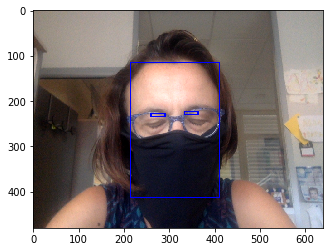

/!\ no eyes found
Extracting face in  dataset_test_20200930/blink/2020-07-10_AnnaMask__031.png
rectangles[]
rectangles[]
109
face = [[217, 121, 417, 426]]
121 426 217 417
0 [217, 121, 417, 426]
235 243
234 240


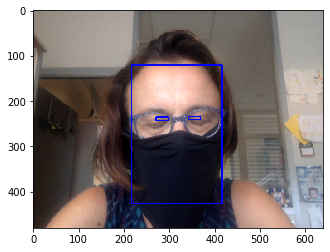

/!\ no eyes found
Extracting face in  dataset_test_20200930/blink/2020-07-10_AnnaMask__077.png
rectangles[]
rectangles[]
105
face = [[213, 107, 416, 448]]
107 448 213 416
0 [213, 107, 416, 448]
215 224
208 217


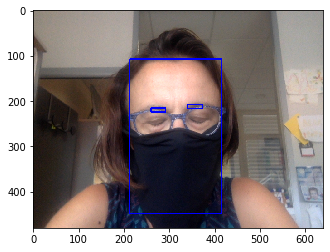

/!\ no eyes found
Extracting face in  dataset_test_20200930/blink/2020-07-10_AnnaMask__089.png
rectangles[]
rectangles[]
109
face = [[214, 110, 419, 452]]
110 452 214 419
0 [214, 110, 419, 452]
218 224
219 224


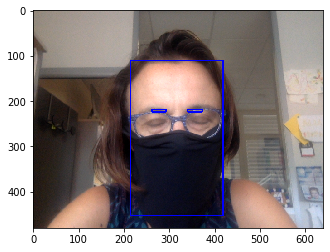

/!\ no eyes found
Extracting face in  dataset_test_20200930/blink/2020-07-15_Ektor__077.png
rectangles[]
rectangles[]
132
face = [[183, 284, 353, 476]]
284 476 183 353
0 [183, 284, 353, 476]
369 382
344 359


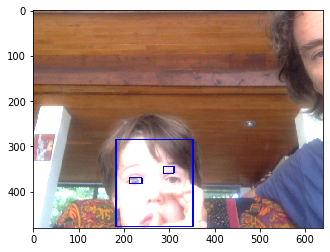

/!\ no eyes found
Extracting face in  dataset_test_20200930/blink/2020-07-10_AnnaMask__042.png
rectangles[]
rectangles[]
120
face = [[215, 125, 414, 423]]
125 423 215 414
0 [215, 125, 414, 423]
243 251
239 243


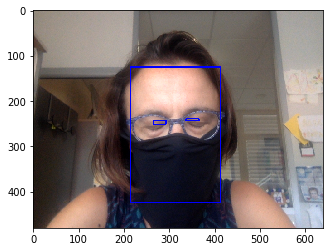

/!\ no eyes found
Extracting face in  dataset_test_20200930/blink/2020-07-10_AnnaMask__010.png
rectangles[]
rectangles[]
103
face = [[207, 109, 409, 398]]
109 398 207 409
0 [207, 109, 409, 398]
226 232
225 228


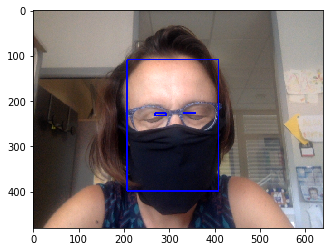

/!\ no eyes found
Extracting face in  dataset_test_20200930/blink/2020-07-10_AnnaMask__035.png
rectangles[]
rectangles[]
117
face = [[218, 121, 415, 422]]
121 422 218 415
0 [218, 121, 415, 422]
237 246
236 242


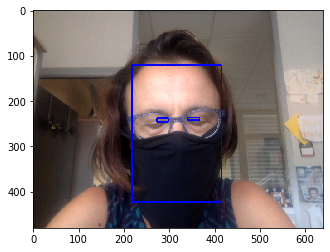

/!\ no eyes found
Extracting face in  dataset_test_20200930/blink/2020-07-10_AnnaMask__038.png
rectangles[]
rectangles[]
114
face = [[218, 121, 417, 426]]
121 426 218 417
0 [218, 121, 417, 426]
237 246
234 237


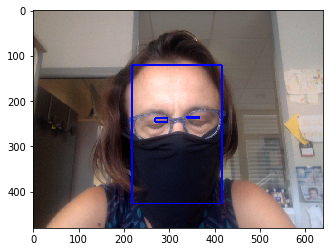

/!\ no eyes found
Extracting face in  dataset_test_20200930/blink/2020-07-10_AnnaMask__041.png
rectangles[]
rectangles[]
104
face = [[216, 123, 415, 418]]
123 418 216 415
0 [216, 123, 415, 418]
241 247
239 243


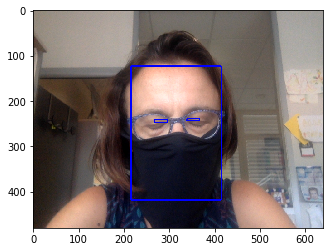

/!\ no eyes found
Extracting face in  dataset_test_20200930/blink/2020-07-10_AnnaMask__072.png
rectangles[]
rectangles[]
112
face = [[215, 107, 417, 442]]
107 442 215 417
0 [215, 107, 417, 442]
213 220
212 221


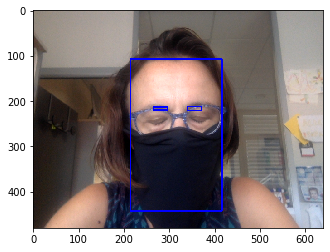

/!\ no eyes found
Extracting face in  dataset_test_20200930/blink/2020-07-10_AnnaMask__053.png
rectangles[]
rectangles[]
122
face = [[211, 126, 414, 406]]
126 406 211 414
0 [211, 126, 414, 406]
239 244
238 244


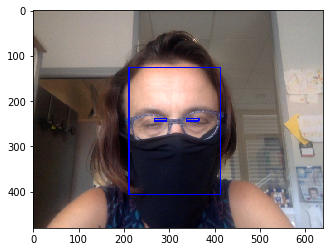

/!\ no eyes found
Extracting face in  dataset_test_20200930/blink/2020-07-10_AnnaMask__016.png
rectangles[]
rectangles[]
119
face = [[215, 118, 413, 430]]
118 430 215 413
0 [215, 118, 413, 430]
228 235
226 230


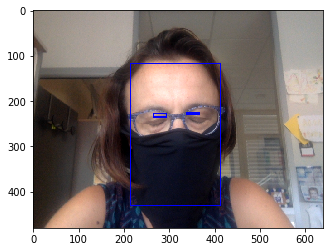

/!\ no eyes found
Extracting face in  dataset_test_20200930/blink/2020-07-10_AnnaMask__069.png
rectangles[]
rectangles[]
113
face = [[217, 107, 416, 440]]
107 440 217 416
0 [217, 107, 416, 440]
216 226
209 214


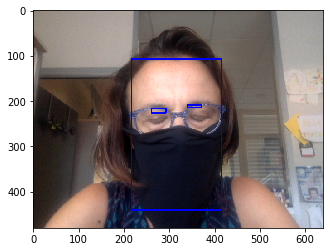

/!\ no eyes found
Extracting face in  dataset_test_20200930/blink/2020-07-10_AnnaMask__008.png
rectangles[]
rectangles[]
106
face = [[210, 106, 409, 388]]
106 388 210 409
0 [210, 106, 409, 388]
226 233
218 222


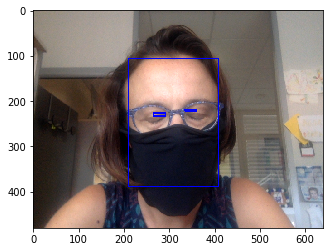

/!\ no eyes found
Extracting face in  dataset_test_20200930/blink/2020-07-10_AnnaMask__012.png
rectangles[]
rectangles[]
123
face = [[213, 113, 411, 399]]
113 399 213 411
0 [213, 113, 411, 399]
231 236
225 229


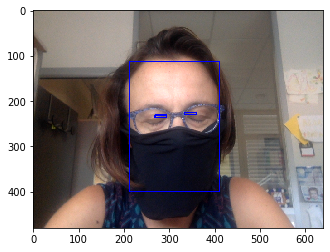

/!\ no eyes found
Extracting face in  dataset_test_20200930/blink/2020-07-10_AnnaMask__039.png
rectangles[]
rectangles[]
109
face = [[216, 124, 414, 417]]
124 417 216 414
0 [216, 124, 414, 417]
239 247
236 241


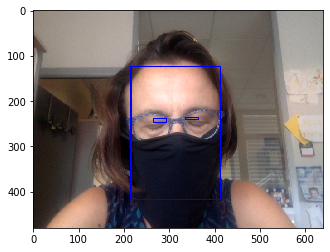

/!\ no eyes found
Extracting face in  dataset_test_20200930/blink/2020-07-10_AnnaMask__085.png
rectangles[]
rectangles[]
110
face = [[211, 109, 417, 446]]
109 446 211 417
0 [211, 109, 417, 446]
221 228
220 226


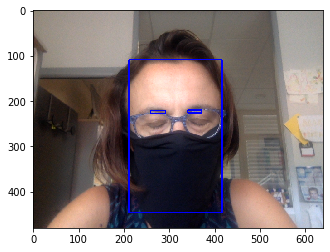

/!\ no eyes found
Extracting face in  dataset_test_20200930/blink/2020-07-10_AnnaMask__009.png
rectangles[]
rectangles[]
110
face = [[204, 102, 407, 386]]
102 386 204 407
0 [204, 102, 407, 386]
216 222
209 215


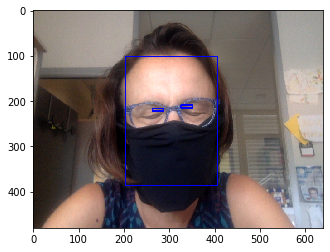

/!\ no eyes found
Extracting face in  dataset_test_20200930/blink/2020-07-10_AnnaMask__005.png
rectangles[]
rectangles[]
116
face = [[209, 102, 409, 404]]
102 404 209 409
0 [209, 102, 409, 404]
219 223
216 221


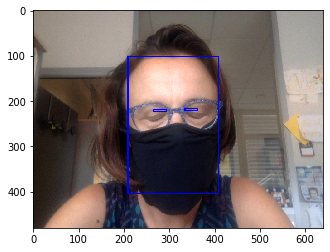

/!\ no eyes found
Extracting face in  dataset_test_20200930/blink/2020-07-10_AnnaMask__084.png
rectangles[]
rectangles[]
108
face = [[212, 109, 417, 451]]
109 451 212 417
0 [212, 109, 417, 451]
221 229
219 227


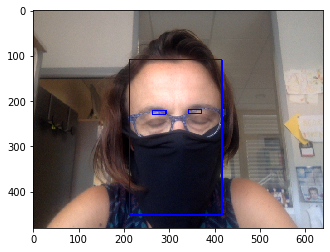

/!\ no eyes found
Extracting face in  dataset_test_20200930/blink/2020-07-10_AnnaMask__064.png
rectangles[]
rectangles[]
108
face = [[217, 122, 416, 433]]
122 433 217 416
0 [217, 122, 416, 433]
240 247
238 242


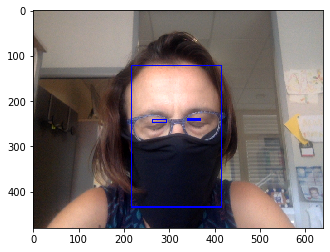

/!\ no eyes found
Extracting face in  dataset_test_20200930/blink/2020-07-10_AnnaMask__026.png
rectangles[]
rectangles[]
114
face = [[215, 110, 415, 444]]
110 444 215 415
0 [215, 110, 415, 444]
229 239
223 226


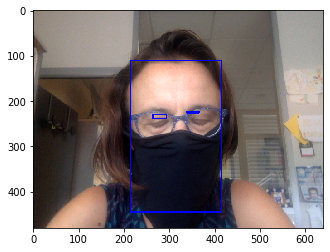

/!\ no eyes found
Extracting face in  dataset_test_20200930/blink/2020-07-10_AnnaMask__054.png
rectangles[]
rectangles[]
114
face = [[213, 124, 414, 419]]
124 419 213 414
0 [213, 124, 414, 419]
242 250
239 244


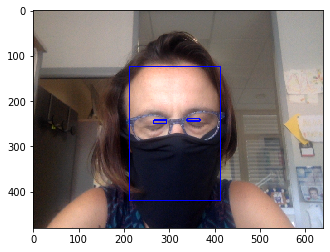

/!\ no eyes found
Extracting face in  dataset_test_20200930/blink/2020-07-10_AnnaMask__030.png
rectangles[]
rectangles[]
114
face = [[219, 119, 417, 432]]
119 432 219 417
0 [219, 119, 417, 432]
233 240
231 235


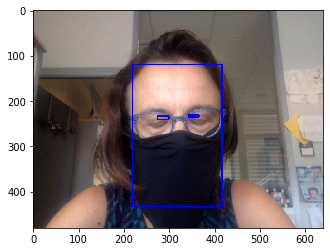

/!\ no eyes found
Extracting face in  dataset_test_20200930/blink/2020-07-10_AnnaMask__101.png
rectangles[]
rectangles[]
104
face = [[218, 122, 420, 422]]
122 422 218 420
0 [218, 122, 420, 422]
238 245
235 239


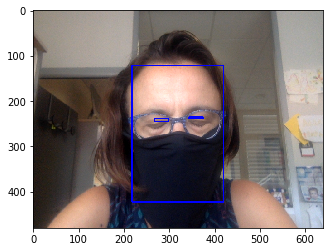

/!\ no eyes found
Extracting face in  dataset_test_20200930/blink/2020-07-10_AnnaMask__007.png
rectangles[]
rectangles[]
122
face = [[212, 105, 410, 398]]
105 398 212 410
0 [212, 105, 410, 398]
222 228
218 222


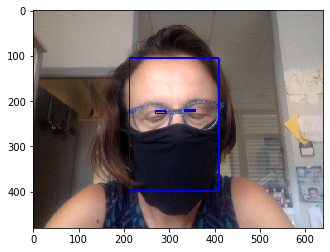

/!\ no eyes found
Extracting face in  dataset_test_20200930/blink/2020-07-10_AnnaMask__011.png
rectangles[]
rectangles[]
120
face = [[212, 113, 412, 397]]
113 397 212 412
0 [212, 113, 412, 397]
229 235
226 229


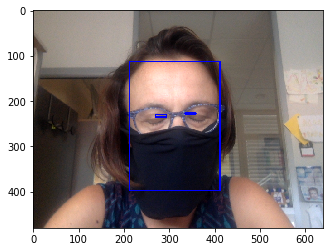

/!\ no eyes found
Extracting face in  dataset_test_20200930/blink/2020-07-10_AnnaMask__049.png
rectangles[]
rectangles[]
114
face = [[209, 122, 411, 392]]
122 392 209 411
0 [209, 122, 411, 392]
244 251
238 242


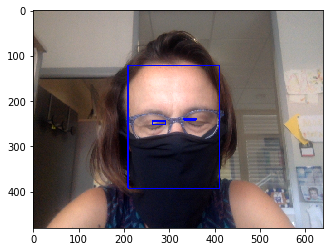

/!\ no eyes found
Extracting face in  dataset_test_20200930/blink/2020-07-10_AnnaMask__062.png
rectangles[]
rectangles[]
110
face = [[215, 123, 415, 423]]
123 423 215 415
0 [215, 123, 415, 423]
241 248
238 240


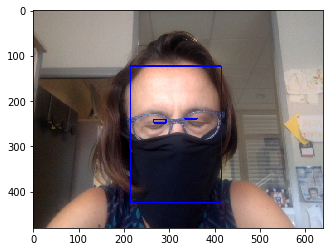

/!\ no eyes found
Extracting face in  dataset_test_20200930/blink/2020-07-10_AnnaMask__074.png
rectangles[]
rectangles[]
111
face = [[214, 106, 417, 443]]
106 443 214 417
0 [214, 106, 417, 443]
223 231
217 221


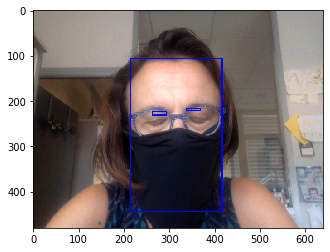

/!\ no eyes found
Extracting face in  dataset_test_20200930/blink/2020-07-10_AnnaMask__047.png
rectangles[]
rectangles[]
111
face = [[214, 126, 413, 406]]
126 406 214 413
0 [214, 126, 413, 406]
240 244
239 244


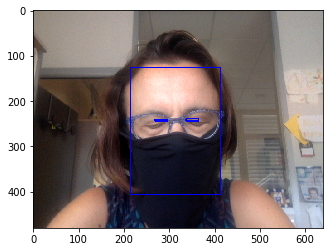

/!\ no eyes found
Extracting face in  dataset_test_20200930/center/2020-07-10_AnnaMask__081.png
rectangles[]
rectangles[]
108
face = [[210, 116, 420, 390]]
116 390 210 420
0 [210, 116, 420, 390]
234 239
229 231


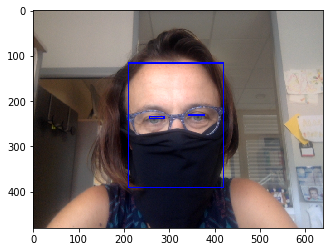

/!\ no eyes found
Extracting face in  dataset_test_20200930/center/2020-07-10_AnnaMask__060.png
rectangles[]
rectangles[]
105
face = [[213, 129, 416, 402]]
129 402 213 416
0 [213, 129, 416, 402]
238 246
236 244


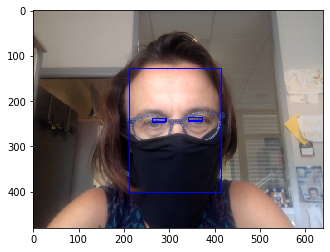

/!\ no eyes found
Extracting face in  dataset_test_20200930/center/2020-07-10_AnnaMask__098.png
rectangles[]
rectangles[]
98
face = [[215, 118, 418, 406]]
118 406 215 418
0 [215, 118, 418, 406]
232 241
230 237


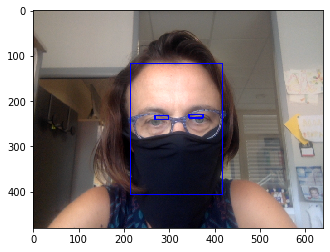

/!\ no eyes found
Extracting face in  dataset_test_20200930/center/2020-07-10_AnnaMask__119.png
rectangles[]
rectangles[]
105
face = [[217, 114, 420, 433]]
114 433 217 420
0 [217, 114, 420, 433]
228 238
226 235


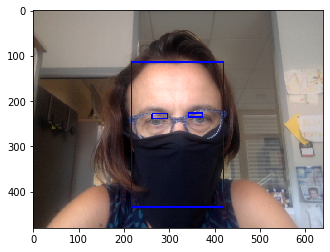

/!\ no eyes found
Extracting face in  dataset_test_20200930/center/2020-07-10_AnnaMask__115.png
rectangles[]
rectangles[]
105
face = [[215, 112, 419, 437]]
112 437 215 419
0 [215, 112, 419, 437]
223 232
222 231


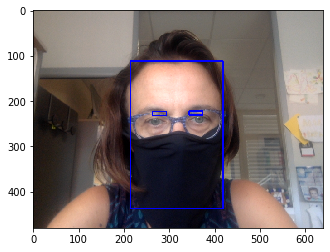

/!\ no eyes found
Extracting face in  dataset_test_20200930/center/2020-07-10_AnnaMask__097.png
rectangles[]
rectangles[]
103
face = [[217, 118, 418, 402]]
118 402 217 418
0 [217, 118, 418, 402]
232 241
229 237


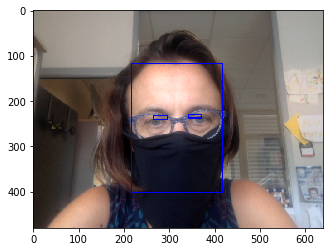

/!\ no eyes found
Extracting face in  dataset_test_20200930/center/2020-07-10_AnnaMask__000.png
rectangles[]
rectangles[]
96
face = [[240, 99, 415, 367]]
99 367 240 415
0 [240, 99, 415, 367]
185 192
186 194


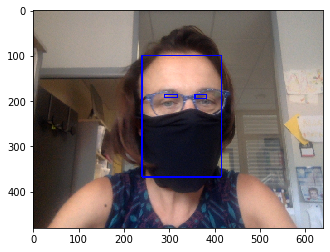

/!\ no eyes found
Extracting face in  dataset_test_20200930/center/2020-07-10_AnnaMask__106.png
rectangles[]
rectangles[]
102
face = [[215, 118, 416, 406]]
118 406 215 416
0 [215, 118, 416, 406]
232 240
230 237


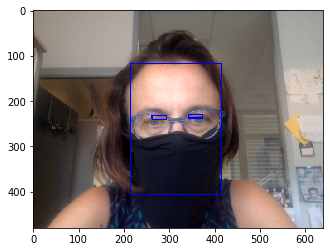

/!\ no eyes found
Extracting face in  dataset_test_20200930/center/2020-07-10_AnnaMask__095.png
rectangles[]
rectangles[]
100
face = [[216, 118, 418, 407]]
118 407 216 418
0 [216, 118, 418, 407]
233 240
231 238


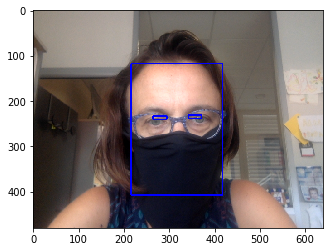

/!\ no eyes found
Extracting face in  dataset_test_20200930/center/2020-07-10_AnnaMask__105.png
rectangles[]
rectangles[]
105
face = [[215, 119, 416, 410]]
119 410 215 416
0 [215, 119, 416, 410]
233 242
229 237


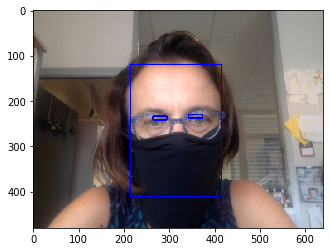

/!\ no eyes found
Extracting face in  dataset_test_20200930/center/2020-07-10_AnnaMask__065.png
rectangles[]
rectangles[]
110
face = [[212, 125, 415, 408]]
125 408 212 415
0 [212, 125, 415, 408]
237 243
234 239


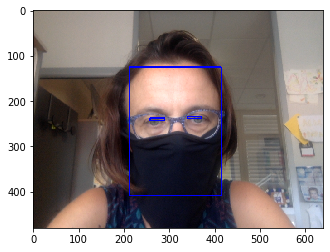

/!\ no eyes found
Extracting face in  dataset_test_20200930/center/2020-07-10_AnnaMask__020.png
rectangles[]
rectangles[]
109
face = [[215, 121, 415, 416]]
121 416 215 415
0 [215, 121, 415, 416]
234 242
229 233


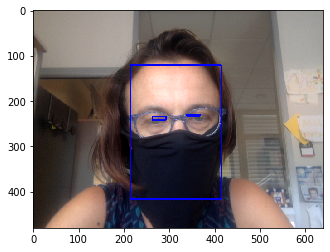

/!\ no eyes found
Extracting face in  dataset_test_20200930/center/2020-07-10_AnnaMask__051.png
rectangles[]
rectangles[]
104
face = [[209, 121, 412, 399]]
121 399 209 412
0 [209, 121, 412, 399]
239 244
233 237


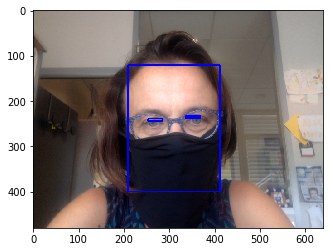

/!\ no eyes found
Extracting face in  dataset_test_20200930/center/2020-07-10_AnnaMask__055.png
rectangles[]
rectangles[]
104
face = [[213, 129, 415, 403]]
129 403 213 415
0 [213, 129, 415, 403]
238 245
236 242


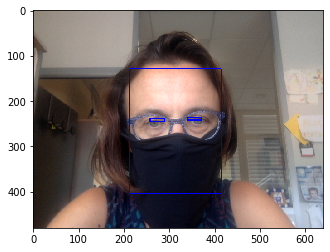

/!\ no eyes found
Extracting face in  dataset_test_20200930/center/2020-07-10_AnnaMask__028.png
rectangles[]
rectangles[]
108
face = [[216, 111, 418, 438]]
111 438 216 418
0 [216, 111, 418, 438]
225 231
223 229


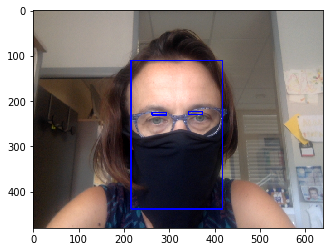

/!\ no eyes found
Extracting face in  dataset_test_20200930/center/2020-07-10_AnnaMask__021.png
rectangles[]
rectangles[]
108
face = [[215, 113, 415, 412]]
113 412 215 415
0 [215, 113, 415, 412]
231 239
226 232


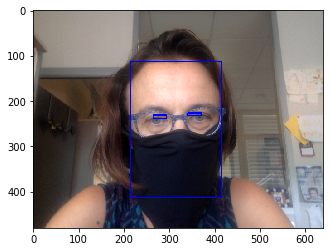

/!\ no eyes found
Extracting face in  dataset_test_20200930/center/2020-07-10_AnnaMask__117.png
rectangles[]
rectangles[]
107
face = [[217, 114, 420, 435]]
114 435 217 420
0 [217, 114, 420, 435]
221 229
220 228


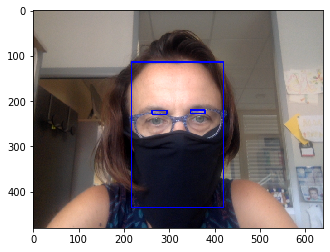

/!\ no eyes found
Extracting face in  dataset_test_20200930/center/2020-07-10_AnnaMask__076.png
rectangles[]
rectangles[]
100
face = [[214, 107, 418, 437]]
107 437 214 418
0 [214, 107, 418, 437]
219 227
216 225


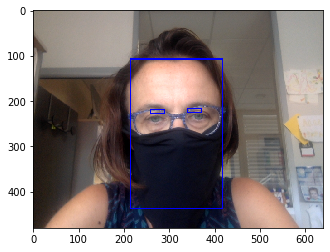

/!\ no eyes found
Extracting face in  dataset_test_20200930/center/2020-07-10_AnnaMask__019.png
rectangles[]
rectangles[]
108
face = [[215, 115, 413, 406]]
115 406 215 413
0 [215, 115, 413, 406]
231 239
225 232


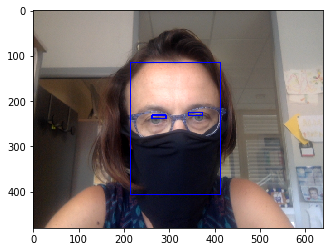

/!\ no eyes found
Extracting face in  dataset_test_20200930/center/2020-07-10_AnnaMask__024.png
rectangles[]
rectangles[]
113
face = [[215, 112, 417, 412]]
112 412 215 417
0 [215, 112, 417, 412]
227 235
224 230


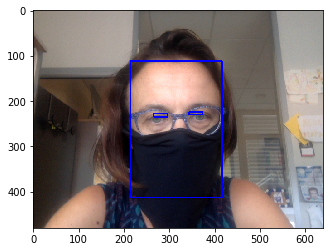

/!\ no eyes found
Extracting face in  dataset_test_20200930/center/2020-07-10_AnnaMask__057.png
rectangles[]
rectangles[]
109
face = [[214, 128, 415, 410]]
128 410 214 415
0 [214, 128, 415, 410]
239 245
236 240


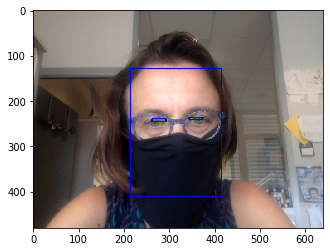

/!\ no eyes found
Extracting face in  dataset_test_20200930/center/2020-07-10_AnnaMask__096.png
rectangles[]
rectangles[]
104
face = [[216, 118, 418, 406]]
118 406 216 418
0 [216, 118, 418, 406]
230 239
228 235


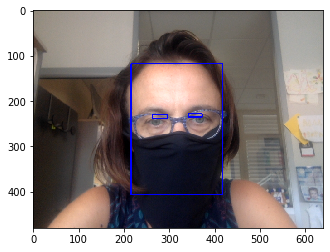

/!\ no eyes found
Extracting face in  dataset_test_20200930/center/2020-07-10_AnnaMask__002.png
rectangles[]
rectangles[]
102
face = [[208, 101, 413, 378]]
101 378 208 413
0 [208, 101, 413, 378]
219 226
213 217


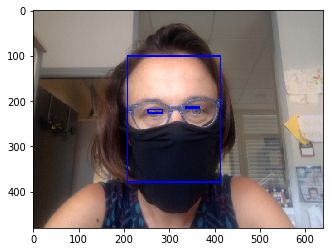

/!\ no eyes found
Extracting face in  dataset_test_20200930/center/2020-07-10_AnnaMask__100.png
rectangles[]
rectangles[]
102
face = [[218, 124, 420, 417]]
124 417 218 420
0 [218, 124, 420, 417]
230 238
227 233


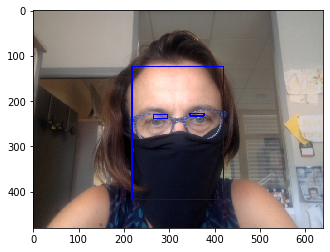

/!\ no eyes found
Extracting face in  dataset_test_20200930/center/2020-07-10_AnnaMask__067.png
rectangles[]
rectangles[]
115
face = [[216, 109, 415, 400]]
109 400 216 415
0 [216, 109, 415, 400]
224 230
221 225


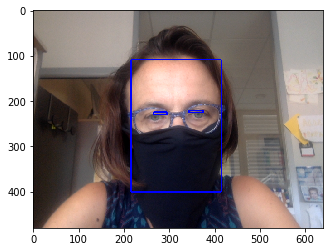

/!\ no eyes found
Extracting face in  dataset_test_20200930/center/2020-07-10_AnnaMask__014.png
rectangles[]
rectangles[]
112
face = [[213, 113, 414, 390]]
113 390 213 414
0 [213, 113, 414, 390]
229 235
225 227


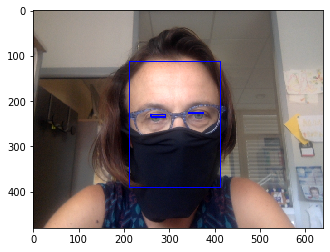

/!\ no eyes found
Extracting face in  dataset_test_20200930/center/2020-07-10_AnnaMask__025.png
rectangles[]
rectangles[]
109
face = [[215, 111, 418, 432]]
111 432 215 418
0 [215, 111, 418, 432]
227 235
223 230


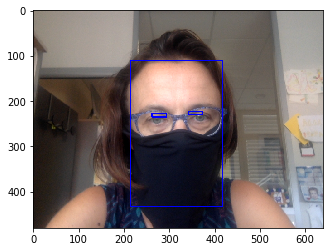

/!\ no eyes found
Extracting face in  dataset_test_20200930/center/2020-07-10_AnnaMask__033.png
rectangles[]
rectangles[]
107
face = [[215, 124, 416, 410]]
124 410 215 416
0 [215, 124, 416, 410]
235 240
231 236


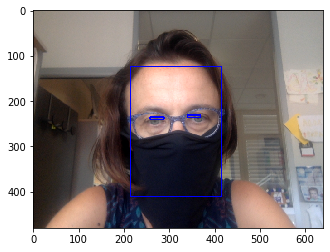

/!\ no eyes found
Extracting face in  dataset_test_20200930/center/2020-07-10_AnnaMask__080.png
rectangles[]
rectangles[]
104
face = [[211, 117, 420, 380]]
117 380 211 420
0 [211, 117, 420, 380]
232 238
229 233


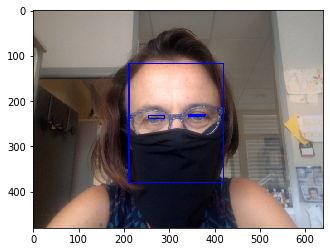

/!\ no eyes found
Extracting face in  dataset_test_20200930/left/2020-07-10_AnnaMask__103.png
rectangles[]
rectangles[]
110
face = [[217, 122, 419, 420]]
122 420 217 419
0 [217, 122, 419, 420]
234 242
229 234


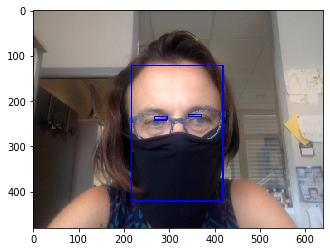

/!\ no eyes found
Extracting face in  dataset_test_20200930/left/2020-07-10_AnnaMask__087.png
rectangles[]
rectangles[]
107
face = [[216, 116, 419, 407]]
116 407 216 419
0 [216, 116, 419, 407]
235 242
232 237


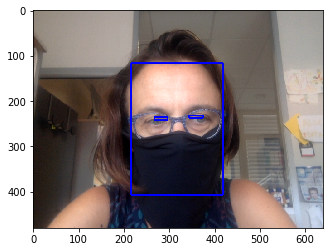

/!\ no eyes found
Extracting face in  dataset_test_20200930/left/2020-07-10_AnnaMask__006.png
rectangles[]
rectangles[]
111
face = [[210, 104, 412, 394]]
104 394 210 412
0 [210, 104, 412, 394]
222 229
217 222


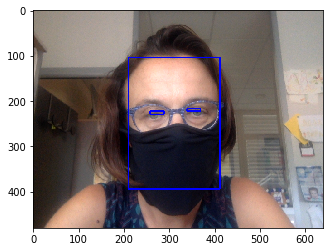

/!\ no eyes found
Extracting face in  dataset_test_20200930/left/2020-07-10_AnnaMask__113.png
rectangles[]
rectangles[]
115
face = [[216, 114, 419, 435]]
114 435 216 419
0 [216, 114, 419, 435]
231 238
227 233


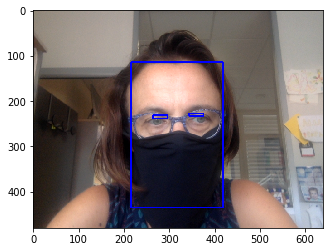

/!\ no eyes found
Extracting face in  dataset_test_20200930/left/2020-07-10_AnnaMask__079.png
rectangles[]
rectangles[]
106
face = [[213, 110, 415, 436]]
110 436 213 415
0 [213, 110, 415, 436]
217 227
214 226


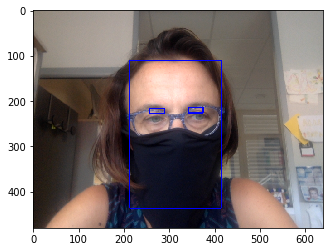

/!\ no eyes found
Extracting face in  dataset_test_20200930/left/2020-07-10_AnnaMask__032.png
rectangles[]
rectangles[]
115
face = [[216, 124, 416, 412]]
124 412 216 416
0 [216, 124, 416, 412]
234 240
231 235


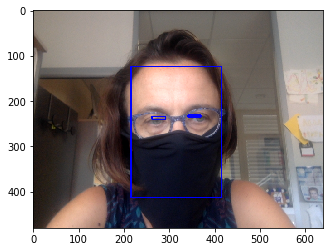

/!\ no eyes found
Extracting face in  dataset_test_20200930/left/2020-07-10_AnnaMask__023.png
rectangles[]
rectangles[]
101
face = [[216, 116, 416, 405]]
116 405 216 416
0 [216, 116, 416, 405]
232 240
227 234


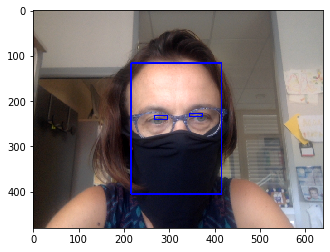

/!\ no eyes found
Extracting face in  dataset_test_20200930/left/2020-07-10_AnnaMask__050.png
rectangles[]
rectangles[]
117
face = [[209, 121, 412, 394]]
121 394 209 412
0 [209, 121, 412, 394]
239 244
234 238


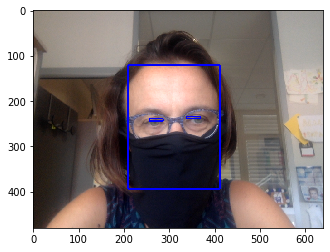

/!\ no eyes found
Extracting face in  dataset_test_20200930/left/2020-07-10_AnnaMask__071.png
rectangles[]
rectangles[]
109
face = [[215, 108, 418, 437]]
108 437 215 418
0 [215, 108, 418, 437]
212 223
208 219


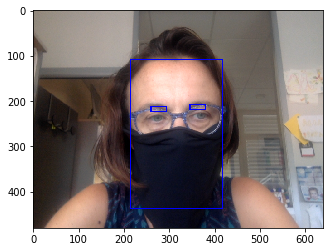

/!\ no eyes found
Extracting face in  dataset_test_20200930/left/2020-07-10_AnnaMask__116.png
rectangles[]
rectangles[]
104
face = [[214, 113, 418, 437]]
113 437 214 418
0 [214, 113, 418, 437]
230 238
225 231


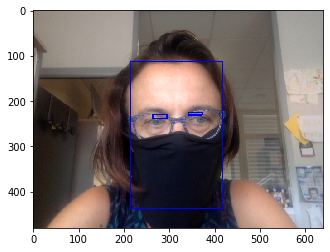

/!\ no eyes found
Extracting face in  dataset_test_20200930/left/2020-07-10_AnnaMask__070.png
rectangles[]
rectangles[]
114
face = [[216, 109, 419, 411]]
109 411 216 419
0 [216, 109, 419, 411]
222 230
217 224


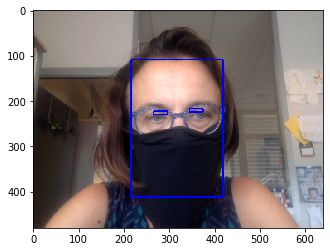

/!\ no eyes found
Extracting face in  dataset_test_20200930/left/2020-07-10_AnnaMask__017.png
rectangles[]
rectangles[]
111
face = [[212, 113, 414, 413]]
113 413 212 414
0 [212, 113, 414, 413]
230 238
225 230


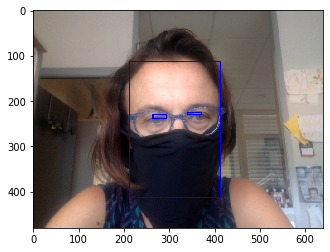

/!\ no eyes found
Extracting face in  dataset_test_20200930/left/2020-07-10_AnnaMask__034.png
rectangles[]
rectangles[]
112
face = [[215, 126, 415, 409]]
126 409 215 415
0 [215, 126, 415, 409]
235 241
230 235


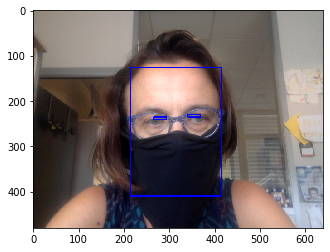

/!\ no eyes found
Extracting face in  dataset_test_20200930/left/2020-07-15_Ektor__051.png
rectangles[]
rectangles[]
113
face = [[182, 243, 332, 464]]
243 464 182 332
0 [182, 243, 332, 464]
299 307
290 299


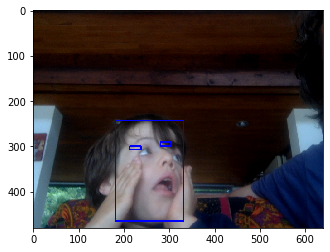

/!\ no eyes found
Extracting face in  dataset_test_20200930/left/2020-07-10_AnnaMask__027.png
rectangles[]
rectangles[]
107
face = [[220, 123, 420, 422]]
123 422 220 420
0 [220, 123, 420, 422]
229 235
227 233


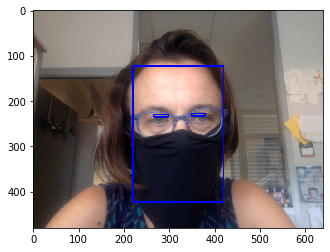

/!\ no eyes found
Extracting face in  dataset_test_20200930/left/2020-07-10_AnnaMask__022.png
rectangles[]
rectangles[]
106
face = [[215, 114, 414, 408]]
114 408 215 414
0 [215, 114, 414, 408]
232 240
227 234


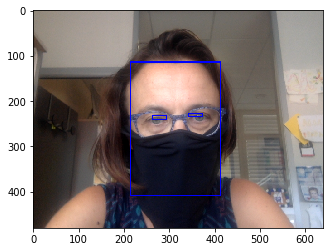

/!\ no eyes found
Extracting face in  dataset_test_20200930/left/2020-07-10_AnnaMask__110.png
rectangles[]
rectangles[]
105
face = [[216, 116, 419, 408]]
116 408 216 419
0 [216, 116, 419, 408]
234 240
233 237


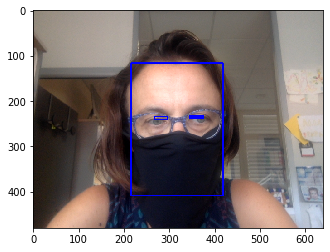

/!\ no eyes found
Extracting face in  dataset_test_20200930/left/2020-07-10_AnnaMask__058.png
rectangles[]
rectangles[]
112
face = [[213, 128, 415, 412]]
128 412 213 415
0 [213, 128, 415, 412]
238 246
236 242


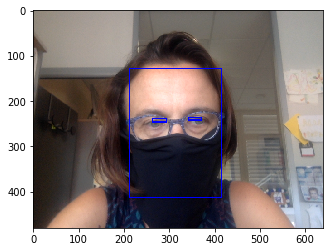

/!\ no eyes found
Extracting face in  dataset_test_20200930/left/2020-07-10_AnnaMask__114.png
rectangles[]
rectangles[]
103
face = [[215, 113, 419, 432]]
113 432 215 419
0 [215, 113, 419, 432]
226 233
224 230


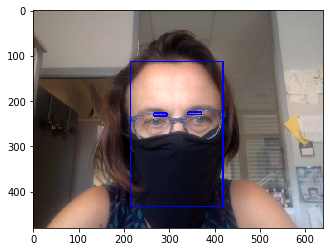

/!\ no eyes found
Extracting face in  dataset_test_20200930/left/2020-07-10_AnnaMask__066.png
rectangles[]
rectangles[]
112
face = [[217, 105, 417, 412]]
105 412 217 417
0 [217, 105, 417, 412]
220 228
215 220


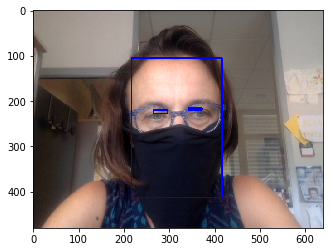

/!\ no eyes found
Extracting face in  dataset_test_20200930/left/2020-07-10_AnnaMask__091.png
rectangles[]
rectangles[]
104
face = [[217, 113, 420, 437]]
113 437 217 420
0 [217, 113, 420, 437]
227 237
223 231


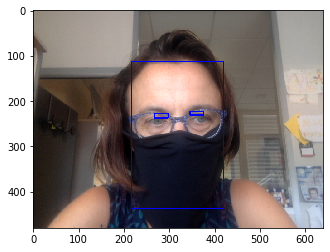

/!\ no eyes found
Extracting face in  dataset_test_20200930/left/2020-07-10_AnnaMask__018.png
rectangles[]
rectangles[]
108
face = [[213, 113, 415, 409]]
113 409 213 415
0 [213, 113, 415, 409]
232 239
225 230


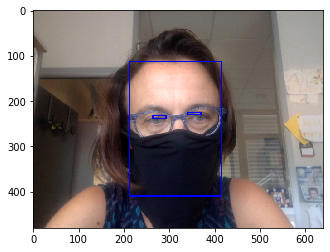

/!\ no eyes found
Extracting face in  dataset_test_20200930/left/2020-07-15_Iason__000.png
rectangles[]
rectangles[]
88
face = [[290, 242, 527, 480]]
242 480 290 527
0 [290, 242, 527, 480]
347 360
353 364


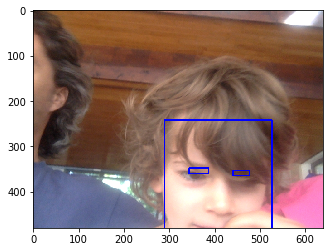

/!\ no eyes found
Extracting face in  dataset_test_20200930/left/2020-07-10_AnnaMask__059.png
rectangles[]
rectangles[]
114
face = [[215, 127, 416, 412]]
127 412 215 416
0 [215, 127, 416, 412]
237 243
235 240


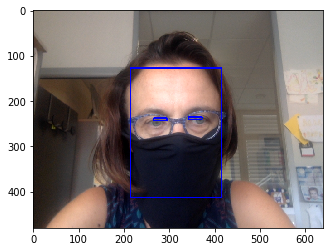

/!\ no eyes found
Extracting face in  dataset_test_20200930/left/2020-07-10_AnnaMask__093.png
rectangles[]
rectangles[]
101
face = [[216, 117, 418, 406]]
117 406 216 418
0 [216, 117, 418, 406]
235 243
232 238


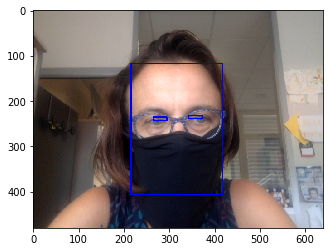

/!\ no eyes found
Extracting face in  dataset_test_20200930/left/2020-07-10_AnnaMask__104.png
rectangles[]
rectangles[]
97
face = [[216, 124, 417, 421]]
124 421 216 417
0 [216, 124, 417, 421]
233 241
229 234


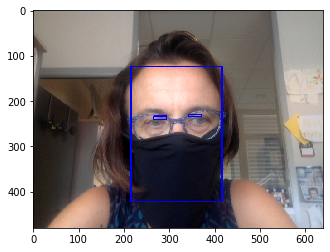

/!\ no eyes found
Extracting face in  dataset_test_20200930/left/2020-07-10_AnnaMask__073.png
rectangles[]
rectangles[]
103
face = [[214, 108, 418, 437]]
108 437 214 418
0 [214, 108, 418, 437]
219 226
218 225


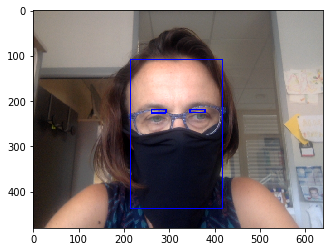

/!\ no eyes found
Extracting face in  dataset_test_20200930/left/2020-07-10_AnnaMask__063.png
rectangles[]
rectangles[]
107
face = [[212, 127, 415, 412]]
127 412 212 415
0 [212, 127, 415, 412]
241 246
238 242


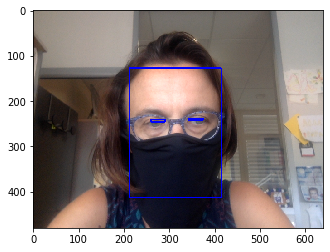

/!\ no eyes found
Extracting face in  dataset_test_20200930/left/2020-07-10_AnnaMask__111.png
rectangles[]
rectangles[]
105
face = [[215, 119, 417, 405]]
119 405 215 417
0 [215, 119, 417, 405]
235 242
231 238


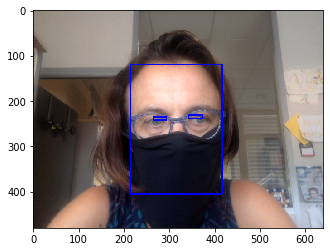

/!\ no eyes found
Extracting face in  dataset_test_20200930/left/2020-07-10_AnnaMask__108.png
rectangles[]
rectangles[]
113
face = [[216, 113, 417, 446]]
113 446 216 417
0 [216, 113, 417, 446]
223 231
219 228


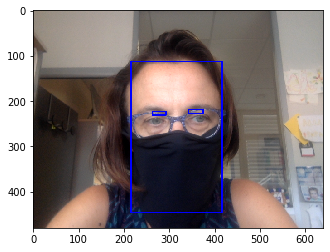

/!\ no eyes found
Extracting face in  dataset_test_20200930/left/2020-07-10_AnnaMask__048.png
rectangles[]
rectangles[]
108
face = [[205, 127, 412, 399]]
127 399 205 412
0 [205, 127, 412, 399]
241 246
238 243


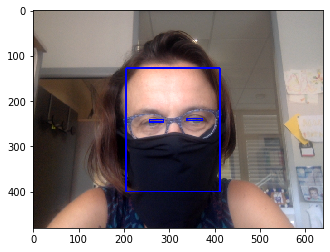

/!\ no eyes found
Extracting face in  dataset_test_20200930/left/2020-07-15_Ektor__052.png
rectangles[]
rectangles[]
84
face = [[141, 240, 337, 446]]
240 446 141 337
0 [141, 240, 337, 446]
291 301
290 301


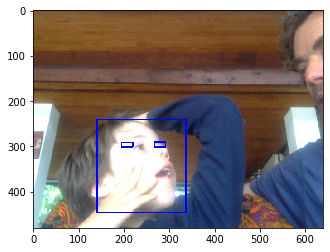

/!\ no eyes found
Extracting face in  dataset_test_20200930/left/2020-07-10_AnnaMask__029.png
rectangles[]
rectangles[]
105
face = [[218, 123, 419, 424]]
123 424 218 419
0 [218, 123, 419, 424]
231 239
227 232


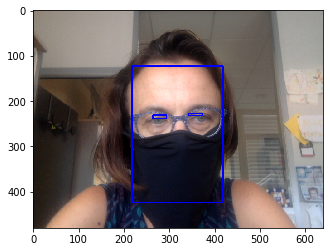

/!\ no eyes found
Extracting face in  dataset_test_20200930/right/2020-07-10_AnnaMask__078.png
rectangles[]
rectangles[]
110
face = [[214, 108, 416, 444]]
108 444 214 416
0 [214, 108, 416, 444]
217 228
213 223


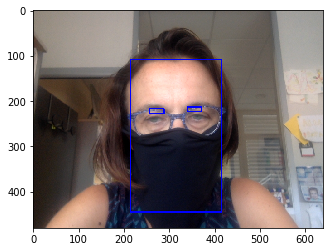

/!\ no eyes found
Extracting face in  dataset_test_20200930/right/2020-07-10_AnnaMask__107.png
rectangles[]
rectangles[]
115
face = [[214, 112, 417, 444]]
112 444 214 417
0 [214, 112, 417, 444]
224 234
221 231


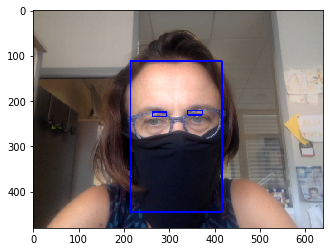

/!\ no eyes found
Extracting face in  dataset_test_20200930/right/2020-07-10_AnnaMask__082.png
rectangles[]
rectangles[]
105
face = [[211, 110, 417, 439]]
110 439 211 417
0 [211, 110, 417, 439]
218 227
216 226


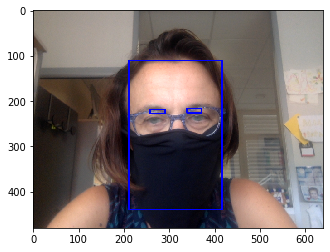

/!\ no eyes found
Extracting face in  dataset_test_20200930/right/2020-07-10_AnnaMask__102.png
rectangles[]
rectangles[]
106
face = [[217, 123, 418, 422]]
123 422 217 418
0 [217, 123, 418, 422]
229 234
228 234


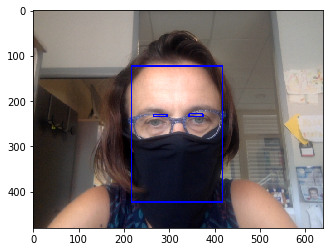

/!\ no eyes found
Extracting face in  dataset_test_20200930/right/2020-07-10_AnnaMask__001.png
rectangles[]
rectangles[]
107
face = [[212, 101, 412, 379]]
101 379 212 412
0 [212, 101, 412, 379]
215 222
211 214


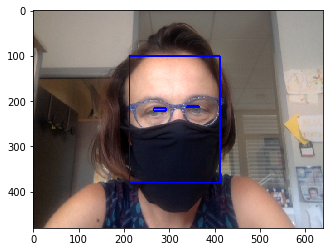

/!\ no eyes found
Extracting face in  dataset_test_20200930/right/2020-07-10_AnnaMask__046.png
rectangles[]
rectangles[]
111
face = [[211, 120, 413, 399]]
120 399 211 413
0 [211, 120, 413, 399]
239 244
234 238


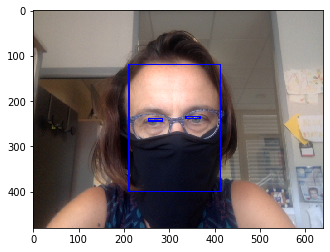

/!\ no eyes found
Extracting face in  dataset_test_20200930/right/2020-07-10_AnnaMask__045.png
rectangles[]
rectangles[]
115
face = [[212, 124, 414, 407]]
124 407 212 414
0 [212, 124, 414, 407]
234 241
234 240


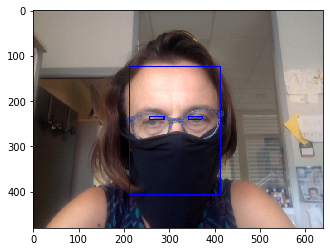

/!\ no eyes found
Extracting face in  dataset_test_20200930/right/2020-07-10_AnnaMask__112.png
rectangles[]
rectangles[]
104
face = [[216, 118, 418, 406]]
118 406 216 418
0 [216, 118, 418, 406]
233 241
231 240


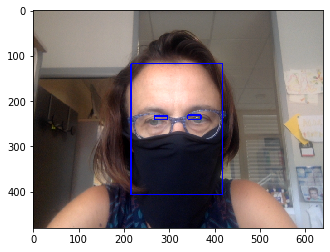

/!\ no eyes found
Extracting face in  dataset_test_20200930/right/2020-07-10_AnnaMask__004.png
rectangles[]
rectangles[]
107
face = [[210, 102, 412, 380]]
102 380 210 412
0 [210, 102, 412, 380]
219 225
216 220


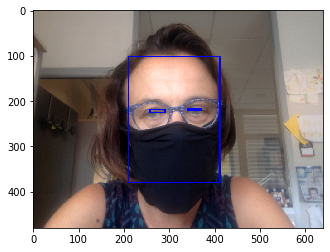

/!\ no eyes found
Extracting face in  dataset_test_20200930/right/2020-07-10_AnnaMask__075.png
rectangles[]
rectangles[]
110
face = [[212, 109, 416, 434]]
109 434 212 416
0 [212, 109, 416, 434]
219 227
218 225


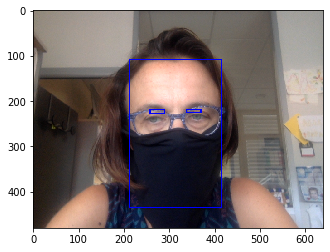

/!\ no eyes found
Extracting face in  dataset_test_20200930/right/2020-07-10_AnnaMask__036.png
rectangles[]
rectangles[]
106
face = [[212, 119, 412, 398]]
119 398 212 412
0 [212, 119, 412, 398]
235 241
231 235


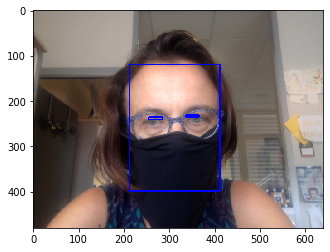

/!\ no eyes found
Extracting face in  dataset_test_20200930/right/2020-07-10_AnnaMask__003.png
rectangles[]
rectangles[]
116
face = [[209, 101, 411, 381]]
101 381 209 411
0 [209, 101, 411, 381]
219 225
213 216


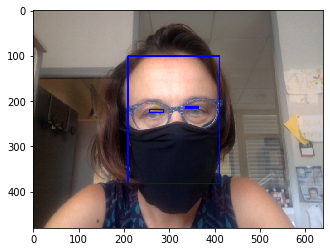

/!\ no eyes found
Extracting face in  dataset_test_20200930/right/2020-07-10_AnnaMask__088.png
rectangles[]
rectangles[]
107
face = [[218, 112, 420, 441]]
112 441 218 420
0 [218, 112, 420, 441]
221 229
223 233


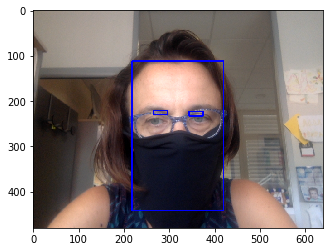

/!\ no eyes found
Extracting face in  dataset_test_20200930/right/2020-07-10_AnnaMask__086.png
rectangles[]
rectangles[]
107
face = [[216, 112, 418, 439]]
112 439 216 418
0 [216, 112, 418, 439]
221 230
219 230


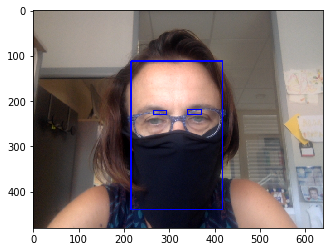

/!\ no eyes found
Extracting face in  dataset_test_20200930/right/2020-07-09_Laurent__005.png
rectangles[[(254, 54) (433, 234)]]
97 108
98 109
face.shape (11, 51, 3)
Extracting face in  dataset_test_20200930/right/2020-07-10_AnnaMask__068.png
rectangles[]
rectangles[]
112
face = [[213, 106, 416, 432]]
106 432 213 416
0 [213, 106, 416, 432]
211 220
210 220


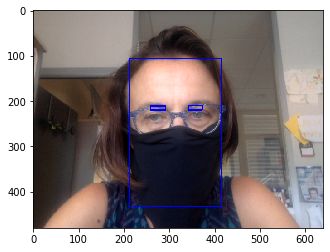

/!\ no eyes found
Extracting face in  dataset_test_20200930/right/2020-07-10_AnnaMask__118.png
rectangles[]
rectangles[]
106
face = [[215, 113, 419, 433]]
113 433 215 419
0 [215, 113, 419, 433]
226 232
225 232


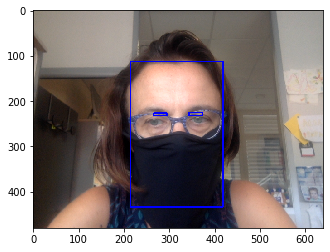

/!\ no eyes found
Extracting face in  dataset_test_20200930/right/2020-07-10_AnnaMask__099.png
rectangles[]
rectangles[]
106
face = [[218, 114, 420, 440]]
114 440 218 420
0 [218, 114, 420, 440]
222 228
223 230


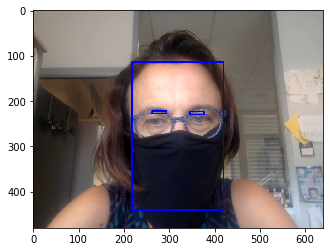

/!\ no eyes found
Extracting face in  dataset_test_20200930/right/2020-07-10_AnnaMask__090.png
rectangles[]
rectangles[]
107
face = [[217, 114, 419, 434]]
114 434 217 419
0 [217, 114, 419, 434]
226 234
225 231


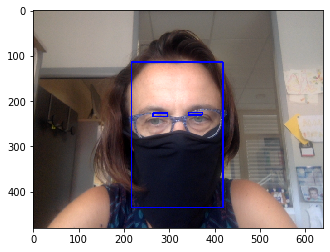

/!\ no eyes found
Extracting face in  dataset_test_20200930/right/2020-07-10_AnnaMask__056.png
rectangles[]
rectangles[]
118
face = [[210, 123, 413, 396]]
123 396 210 413
0 [210, 123, 413, 396]
242 248
238 241


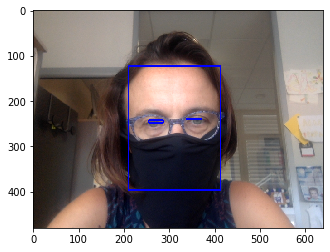

/!\ no eyes found
Extracting face in  dataset_test_20200930/right/2020-07-10_AnnaMask__109.png
rectangles[]
rectangles[]
108
face = [[213, 113, 416, 439]]
113 439 213 416
0 [213, 113, 416, 439]
230 239
228 233


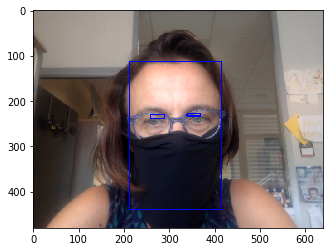

/!\ no eyes found
Extracting face in  dataset_test_20200930/right/2020-07-10_AnnaMask__052.png
rectangles[]
rectangles[]
119
face = [[211, 125, 414, 413]]
125 413 211 414
0 [211, 125, 414, 413]
239 244
236 239


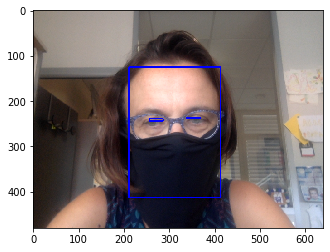

/!\ no eyes found
Extracting face in  dataset_test_20200930/right/2020-07-10_AnnaMask__083.png
rectangles[]
rectangles[]
101
face = [[215, 110, 418, 442]]
110 442 215 418
0 [215, 110, 418, 442]
218 229
215 226


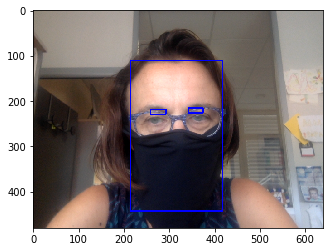

/!\ no eyes found
Extracting face in  dataset_test_20200930/right/2020-07-10_AnnaMask__092.png
rectangles[]
rectangles[]
111
face = [[220, 113, 419, 440]]
113 440 220 419
0 [220, 113, 419, 440]
224 233
223 232


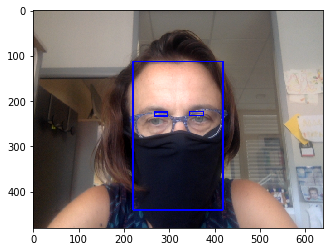

/!\ no eyes found
Extracting face in  dataset_test_20200930/right/2020-07-10_AnnaMask__040.png
rectangles[]
rectangles[]
107
face = [[214, 127, 415, 410]]
127 410 214 415
0 [214, 127, 415, 410]
238 244
236 239


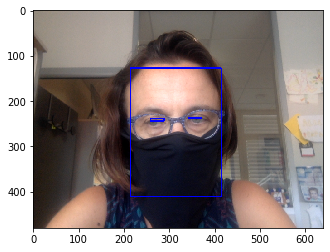

/!\ no eyes found
Extracting face in  dataset_test_20200930/right/2020-07-10_AnnaMask__061.png
rectangles[]
rectangles[]
107
face = [[213, 128, 415, 408]]
128 408 213 415
0 [213, 128, 415, 408]
240 246
238 241


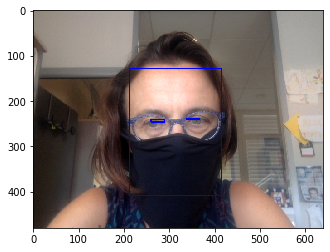

/!\ no eyes found
Extracting face in  dataset_test_20200930/right/2020-07-10_AnnaMask__013.png
rectangles[]
rectangles[]
109
face = [[215, 111, 415, 404]]
111 404 215 415
0 [215, 111, 415, 404]
225 232
222 228


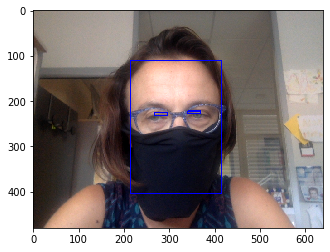

/!\ no eyes found
Extracting face in  dataset_test_20200930/right/2020-07-10_AnnaMask__015.png
rectangles[]
rectangles[]
108
face = [[212, 113, 412, 404]]
113 404 212 412
0 [212, 113, 412, 404]
228 236
223 229


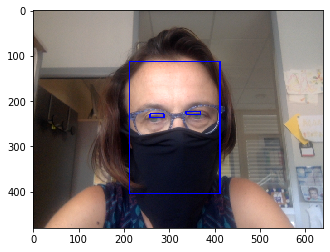

/!\ no eyes found
Extracting face in  dataset_test_20200930/right/2020-07-10_AnnaMask__044.png
rectangles[]
rectangles[]
126
face = [[214, 125, 416, 410]]
125 410 214 416
0 [214, 125, 416, 410]
237 242
235 239


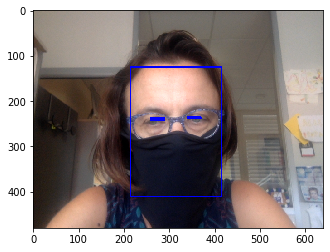

/!\ no eyes found
Extracting face in  dataset_test_20200930/right/2020-07-10_AnnaMask__094.png
rectangles[]
rectangles[]
107
face = [[220, 112, 420, 447]]
112 447 220 420
0 [220, 112, 420, 447]
223 231
217 224


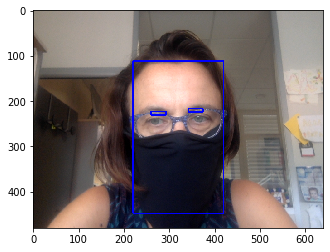

/!\ no eyes found
Extracting face in  dataset_test_20200930/right/2020-07-10_AnnaMask__037.png
rectangles[]
rectangles[]
106
face = [[214, 125, 416, 411]]
125 411 214 416
0 [214, 125, 416, 411]
237 242
236 240


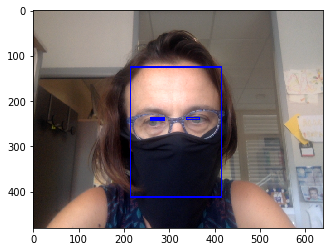

/!\ no eyes found


In [23]:
import imageio
import time
#from LeCheapEyeTracker_copy.EyeTrackerServer import FaceExtractor

FE = FaceExtractor()
timings = []
for target in d.classes:
    for filename in glob.glob(os.path.join(args.dataset_folder, target, '*.png')):
        filename_face = filename.replace(args.dataset_folder, args.dataset_faces_folder)
        
        print('Extracting face in ', filename_face)
        frame = imageio.imread(filename)
        t0 = time.time()
        face = FE.face_extractor(frame)#, bbox=(t, b, l, r))

        if np.all(face) != None :

            t1 = time.time()
            timings.append(t1-t0)

            #fig, ax = plt.subplots(figsize=(15, 8))
            #ax.imshow(face)

            #plt.show()                

            print('face.shape', face.shape)
            imageio.imwrite(filename_face, face)

        #else :
        #    fig, ax = plt.subplots(figsize=(15, 8))
        #    ax.imshow(frame)
        #
        #    plt.show()    


In [14]:
if len(timings)>0: 
    timings_ms = np.array(timings) * 1000
    print('timings in ms =', timings_ms.mean(), '+/-', timings_ms.std()) 

In [10]:
import os
fname = 'figures/dlib_timings'
if not os.path.exists(fname + '.pdf'):
    if len(timings)>0:
        fig, ax = plt.subplots(figsize=((8, 5)))
        n, bins, patches = ax.hist(timings_ms, bins=np.linspace(100, 200, 100), alpha=.4)
        ax.vlines(np.median(timings_ms), 0, n.max(), 'g', linestyles='dashed', label='median = %.3f ms' % np.median(timings))
        ax.set_xlabel('Timings (ms)')
        ax.set_ylabel('Smarts')
        ax.legend(loc='best')
        for ext in ['.pdf', '.png']:
            plt.savefig(fname + ext)        